In [8]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import re
from wordcloud import WordCloud

from ydata_profiling import ProfileReport

%matplotlib inline

pd.options.mode.chained_assignment = None  # default='warn'

# your code that triggers the warning goes here

pd.options.mode.chained_assignment = 'warn'  # set it back to the default value

In [19]:
 
# Specifying data types for columns while reading a CSV file
dtype_dict = {
    "number": "str",
    "closed": "str", 
    "case": "str",
    "description": "str",
    "case_type": "category",
    "due_date": "str", 
    "first_response_time": "str", 
    "opened": "str",  
    "account": "category",
    "contact": "category",
    "created_by": "category",
    "business_service": "category",
    "business_service_activity": "category",
    "assigned_to": "category",
    "assignment_group": "category",
    "auto_close": "category",
    "time_worked": "float",
    "reassignment_count": "int",
    "impact": "category",
    "priority": "category",
    "urgency": "category",
    "escalation": "category",
    "comments": "str",
    "case_cause": "category",
    "cause": "str",
    "close_notes": "str",
    "resolution_code": "category",
    "problem": "category",
    "business_percentage": "float",
    "sla_has_breached": "category",
    "duration": "float",
    "openedToClosed": "float",
    "cluster": "int" 
}

# read csv file into dataframe
df = pd.read_csv('Data/data_withclusters.csv', dtype = dtype_dict)

# print shape of dataframe 
print(df.shape)
print(df.columns)
display(df)

(26714, 34)
Index(['number', 'closed', 'case', 'description', 'case_type', 'due_date',
       'first_response_time', 'opened', 'account', 'contact', 'created_by',
       'business_service', 'business_service_activity', 'assigned_to',
       'assignment_group', 'auto_close', 'time_worked', 'reassignment_count',
       'impact', 'priority', 'urgency', 'escalation', 'comments', 'case_cause',
       'cause', 'close_notes', 'resolution_code', 'problem',
       'business_percentage', 'sla_has_breached', 'duration', 'openedToClosed',
       'created_by_cleaned', 'cluster'],
      dtype='object')


,number,closed,case,description,case_type,due_date,first_response_time,opened,account,contact,...,cause,close_notes,resolution_code,problem,business_percentage,sla_has_breached,duration,openedToClosed,created_by_cleaned,cluster
0,CS0011285,2020-11-03 08:21:44,Standardschrift Frutiger Light 47 CN​CS0011285,Hallo zusammen\r\r\r\n\r\r\r\nWir haben festge...,Request,NaN,NaN,2020-01-07 16:36:26,Ghelma AG Spezialtiefbau,Matthias Oesch,...,NaN,NaN,NaN,NaN,379.06,TRUE,3500162.0,7215.755000,Unico,4
1,CS0011375,2020-11-10 09:30:01,Anzeigefehler in VDI​CS0011375,"Herr Marques meldet, dass alle Testuser auf de...",Request,NaN,NaN,2020-01-09 14:28:18,BKS Rechtsanwälte AG,Fabio Dias Marques,...,NaN,NaN,NaN,NaN,1445.90,TRUE,14294890.0,7339.028611,Unico,4
2,CS0011381,2020-05-18 21:10:46,Herr Steiner - HP Notebook Docking Probleme​CS...,Hallo Nathanael\r\r\n\r\r\nNur so zur Info mei...,Trouble,NaN,2020-05-04 14:26:29,2020-01-09 16:32:00,Saphir Group Networks AG,Johan Kroeze,...,Workaround mit Windows Energy Einstellungen (K...,Workaround mit Windows Energy Einstellungen (K...,Solved – Fixed by Support/Guidance provided,NaN,105.62,TRUE,527295.0,3124.646111,Unico,4
3,CS0011489,2020-06-01 12:30:03,Laptop schaltet sich nach 5 min aus (wenn nich...,NaN,Trouble,NaN,2020-01-27 11:25:54,2020-01-13 12:31:44,Amstutz Greuter Rechtsanwälte,Jasmin Mürner,...,Garantiefall,Das Gerät wurde an den Kunden zurückgesendet,Solved by Customer,NaN,548.15,TRUE,2895069.0,3359.971944,Unico,4
4,CS0011676,2020-01-16 13:46:48,Herr Kunz hat mehrere Probleme bei der Ansicht...,1. Excel Dokumente können in Outlook nicht geö...,Request,NaN,NaN,2020-01-16 08:15:39,Ghelma AG Spezialtiefbau,NaN,...,NaN,1. Excel Dokumente können in Outlook nicht geö...,Solved – Fixed by Support/Guidance provided,NaN,9.48,FALSE,18433.0,5.519167,Unico,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26709,CS0077175,2024-02-21 16:54:37,"Sharon Franzo, «Polypoint PEP» freischalten​CS...",Guten Tag\r\r\r\n\r\r\r\nKönnten Sie bitte auc...,Request,NaN,NaN,2024-02-20 16:25:38,Reliva AG,Sharon Franzo,...,NaN,NaN,NaN,NaN,0.93,FALSE,1806.0,24.483056,Unico,6
26710,CS0077184,2024-02-21 08:14:16,"Salome Trachsel, Login issues, VDI​CS0077184",Wrong thin client message... closed and reopened,Request,NaN,NaN,2024-02-21 07:59:27,Siloah AG,Christina Sperling,...,NaN,NaN,NaN,NaN,0.01,FALSE,28.0,0.246944,Unico,6
26711,CS0077188,2024-02-21 14:22:49,"Christoph Bürki, Zugriff Ordner: G:\Hotellerie...",Guten Tag\r\r\r\n\r\r\r\nBitte für @Schneider ...,Request,NaN,NaN,2024-02-21 08:26:06,Siloah Kühlewil AG,Christoph Buerki,...,NaN,NaN,NaN,NaN,10.87,FALSE,21126.0,5.945278,Unico,6
26712,CS0077269,2024-02-22 16:31:46,"Brigitte Hager, Berechtigung für Laptop-Benutz...",Guten Tag\r\r\r\n\r\r\r\nWir drei Frauen in de...,Request,NaN,NaN,2024-02-22 15:59:37,Siloah Kühlewil AG,Brigitte Hager,...,NaN,NaN,NaN,NaN,0.39,FALSE,766.0,0.535833,Unico,6


c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\ydata_profiling\utils\dataframe.py:137: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.rename(columns={"index": "df_index"}, inplace=True)


Cluster 4


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\ydata_profiling\model\correlations.py:66: UserWarning: There was an attempt to calculate the auto correlation, but this failed.
To hide this warning, disable the calculation
(using `df.profile_report(correlations={"auto": {"calculate": False}})`
If this is problematic for your use case, please report this as an issue:
https://github.com/ydataai/ydata-profiling/issues
(include the error message: 'could not convert string to float: 'IT Operations'')
  warnings.warn(
c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\seaborn\matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)
c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\ydata_profiling\model\missing.py:78: UserWarning: There was an attempt to generate the Heatmap missing values diagrams, but this failed.
To hide t

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Cluster 2


c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\ydata_profiling\utils\dataframe.py:137: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.rename(columns={"index": "df_index"}, inplace=True)


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\ydata_profiling\model\correlations.py:66: UserWarning: There was an attempt to calculate the auto correlation, but this failed.
To hide this warning, disable the calculation
(using `df.profile_report(correlations={"auto": {"calculate": False}})`
If this is problematic for your use case, please report this as an issue:
https://github.com/ydataai/ydata-profiling/issues
(include the error message: 'could not convert string to float: 'Service Desk 1st Level'')
  warnings.warn(
c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\seaborn\matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)
c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\ydata_profiling\model\missing.py:78: UserWarning: There was an attempt to generate the Heatmap missing values diagrams, but this failed.


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Cluster 3


c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\ydata_profiling\utils\dataframe.py:137: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.rename(columns={"index": "df_index"}, inplace=True)


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\ydata_profiling\model\correlations.py:66: UserWarning: There was an attempt to calculate the auto correlation, but this failed.
To hide this warning, disable the calculation
(using `df.profile_report(correlations={"auto": {"calculate": False}})`
If this is problematic for your use case, please report this as an issue:
https://github.com/ydataai/ydata-profiling/issues
(include the error message: 'could not convert string to float: 'Pathé Westside AG'')
  warnings.warn(
c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\seaborn\matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)
c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\ydata_profiling\model\missing.py:78: UserWarning: There was an attempt to generate the Heatmap missing values diagrams, but this failed.
To hi

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Cluster 7


c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\ydata_profiling\utils\dataframe.py:137: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.rename(columns={"index": "df_index"}, inplace=True)


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\ydata_profiling\model\correlations.py:66: UserWarning: There was an attempt to calculate the auto correlation, but this failed.
To hide this warning, disable the calculation
(using `df.profile_report(correlations={"auto": {"calculate": False}})`
If this is problematic for your use case, please report this as an issue:
https://github.com/ydataai/ydata-profiling/issues
(include the error message: 'could not convert string to float: 'Squad Platform'')
  warnings.warn(
c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\seaborn\matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)
c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\ydata_profiling\model\missing.py:78: UserWarning: There was an attempt to generate the Heatmap missing values diagrams, but this failed.
To hide 

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Cluster 6


c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\ydata_profiling\utils\dataframe.py:137: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.rename(columns={"index": "df_index"}, inplace=True)


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\ydata_profiling\model\correlations.py:66: UserWarning: There was an attempt to calculate the auto correlation, but this failed.
To hide this warning, disable the calculation
(using `df.profile_report(correlations={"auto": {"calculate": False}})`
If this is problematic for your use case, please report this as an issue:
https://github.com/ydataai/ydata-profiling/issues
(include the error message: 'could not convert string to float: 'Service Desk 1st Level'')
  warnings.warn(
c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\seaborn\matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)
c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\ydata_profiling\model\missing.py:78: UserWarning: There was an attempt to generate the Heatmap missing values diagrams, but this failed.


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Cluster 1


c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\ydata_profiling\utils\dataframe.py:137: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.rename(columns={"index": "df_index"}, inplace=True)


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\ydata_profiling\model\correlations.py:66: UserWarning: There was an attempt to calculate the auto correlation, but this failed.
To hide this warning, disable the calculation
(using `df.profile_report(correlations={"auto": {"calculate": False}})`
If this is problematic for your use case, please report this as an issue:
https://github.com/ydataai/ydata-profiling/issues
(include the error message: 'could not convert string to float: 'Saphir Group Networks AG'')
  warnings.warn(
c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\seaborn\matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)
c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\ydata_profiling\model\missing.py:78: UserWarning: There was an attempt to generate the Heatmap missing values diagrams, but this failed

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Cluster 5


c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\ydata_profiling\utils\dataframe.py:137: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.rename(columns={"index": "df_index"}, inplace=True)


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\ydata_profiling\model\correlations.py:66: UserWarning: There was an attempt to calculate the auto correlation, but this failed.
To hide this warning, disable the calculation
(using `df.profile_report(correlations={"auto": {"calculate": False}})`
If this is problematic for your use case, please report this as an issue:
https://github.com/ydataai/ydata-profiling/issues
(include the error message: 'could not convert string to float: 'Service Desk 1st Level'')
  warnings.warn(
c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\seaborn\matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)
c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\ydata_profiling\model\missing.py:78: UserWarning: There was an attempt to generate the Heatmap missing values diagrams, but this failed.


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

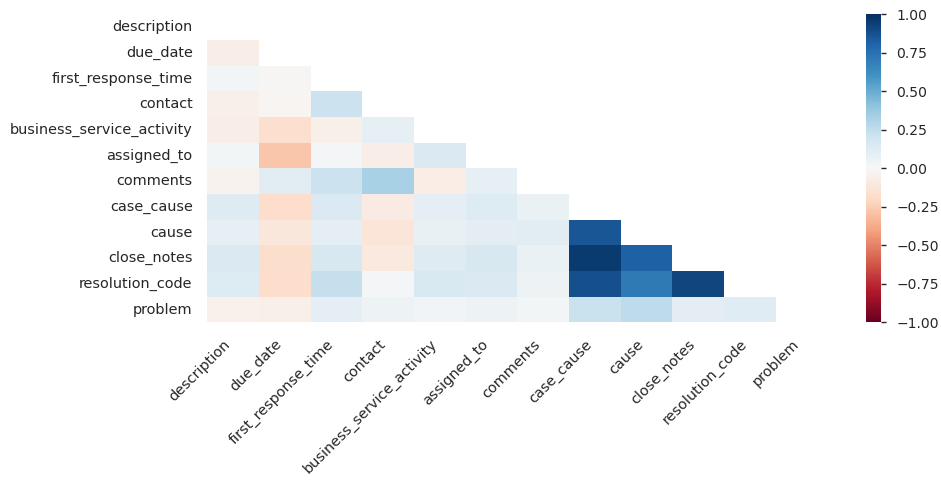

In [10]:
# For each Cluster to a Profile Report
for cluster in df['cluster'].unique():
    print(f"Cluster {cluster}")
    profile = ProfileReport(df[df['cluster'] == cluster], title=f"Profiling Report for Cluster {cluster}")
    profile.to_file(f"./html/Profiling Report for Cluster {cluster}.html")
# profile = ProfileReport(df, title="Profiling Report")
# profile.to_notebook_iframe()

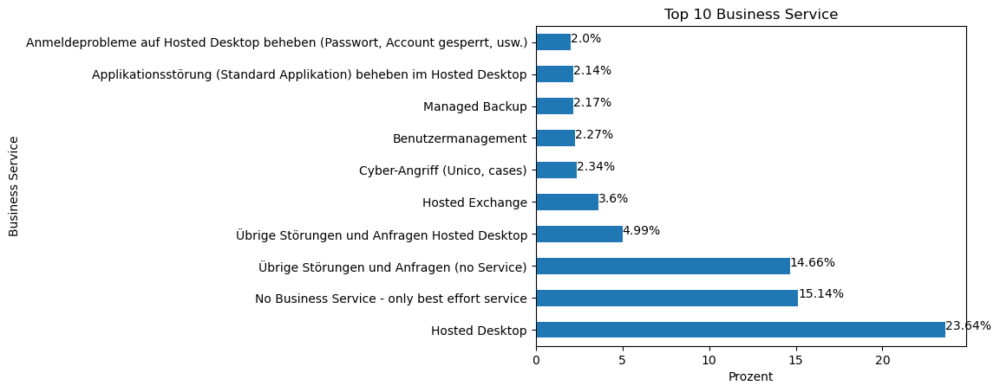

In [6]:
(df["business_service"].value_counts() / len(df) * 100).head(10).plot(kind = "barh")
# add procent value to bar
for index, value in enumerate((df["business_service"].value_counts() / len(df) * 100).head(10)):
    plt.text(value, index, str(round(value, 2)) + '%')
plt.title("Top 10 Business Service")
plt.xlabel("Prozent")
plt.ylabel("Business Service")
plt.show()

In [20]:
# displau Short Description (case), Description, Cause and close_notes
df_text = df[['case', 'description', 'cause', 'close_notes']]

# preprocess df_text columns 

display(df_text)

,case,description,cause,close_notes
0,Standardschrift Frutiger Light 47 CN​CS0011285,Hallo zusammen\r\r\r\n\r\r\r\nWir haben festge...,NaN,NaN
1,Anzeigefehler in VDI​CS0011375,"Herr Marques meldet, dass alle Testuser auf de...",NaN,NaN
2,Herr Steiner - HP Notebook Docking Probleme​CS...,Hallo Nathanael\r\r\n\r\r\nNur so zur Info mei...,Workaround mit Windows Energy Einstellungen (K...,Workaround mit Windows Energy Einstellungen (K...
3,Laptop schaltet sich nach 5 min aus (wenn nich...,NaN,Garantiefall,Das Gerät wurde an den Kunden zurückgesendet
4,Herr Kunz hat mehrere Probleme bei der Ansicht...,1. Excel Dokumente können in Outlook nicht geö...,NaN,1. Excel Dokumente können in Outlook nicht geö...
...,...,...,...,...
26709,"Sharon Franzo, «Polypoint PEP» freischalten​CS...",Guten Tag\r\r\r\n\r\r\r\nKönnten Sie bitte auc...,NaN,NaN
26710,"Salome Trachsel, Login issues, VDI​CS0077184",Wrong thin client message... closed and reopened,NaN,NaN
26711,"Christoph Bürki, Zugriff Ordner: G:\Hotellerie...",Guten Tag\r\r\r\n\r\r\r\nBitte für @Schneider ...,NaN,NaN
26712,"Brigitte Hager, Berechtigung für Laptop-Benutz...",Guten Tag\r\r\r\n\r\r\r\nWir drei Frauen in de...,NaN,NaN


In [21]:
def process_captions(data, column):
    data[column] = data[column].apply(lambda x: x.replace('\n', ' '))
    data[column] = data[column].apply(lambda x: x.replace('-', ' '))
    data[column] = data[column].apply(lambda x: x.lower())
    data[column] = data[column].apply(lambda x: re.sub('[^a-zA-Z0-9\s]', ' ', x))
    return data[column]

# change datatype of columns to string
df_text['case'] = df_text['case'].astype(str).copy()
df_text['description'] = df_text['description'].astype(str).copy()
df_text['cause'] = df_text['cause'].astype(str).copy()
df_text['close_notes'] = df_text['close_notes'].astype(str).copy()

df_text['case'] = process_captions(df_text, 'case').copy()
df_text['description'] = process_captions(df_text, 'description').copy()
df_text['cause'] = process_captions(df_text, 'cause').copy()
df_text['close_notes'] = process_captions(df_text, 'close_notes').copy()

display(df_text)

C:\Users\Student\AppData\Local\Temp\ipykernel_7672\3169275906.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_text['case'] = df_text['case'].astype(str).copy()
C:\Users\Student\AppData\Local\Temp\ipykernel_7672\3169275906.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_text['description'] = df_text['description'].astype(str).copy()
C:\Users\Student\AppData\Local\Temp\ipykernel_7672\3169275906.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Tr

,case,description,cause,close_notes
0,standardschrift frutiger light 47 cn cs0011285,hallo zusammen\r\r\r \r\r\r wir haben festgest...,nan,nan
1,anzeigefehler in vdi cs0011375,herr marques meldet dass alle testuser auf de...,nan,nan
2,herr steiner hp notebook docking probleme cs...,hallo nathanael\r\r \r\r nur so zur info mein ...,workaround mit windows energy einstellungen k...,workaround mit windows energy einstellungen k...
3,laptop schaltet sich nach 5 min aus wenn nich...,nan,garantiefall,das ger t wurde an den kunden zur ckgesendet
4,herr kunz hat mehrere probleme bei der ansicht...,1 excel dokumente k nnen in outlook nicht ge ...,nan,1 excel dokumente k nnen in outlook nicht ge ...
...,...,...,...,...
26709,sharon franzo polypoint pep freischalten cs...,guten tag\r\r\r \r\r\r k nnten sie bitte auch ...,nan,nan
26710,salome trachsel login issues vdi cs0077184,wrong thin client message closed and reopened,nan,nan
26711,christoph b rki zugriff ordner g hotellerie...,guten tag\r\r\r \r\r\r bitte f r schneider re...,nan,nan
26712,brigitte hager berechtigung f r laptop benutz...,guten tag\r\r\r \r\r\r wir drei frauen in der ...,nan,nan


In [ ]:
# export to parquet file
df_text.to_csv('Data/text_cleaned.csv')

In [22]:
import requests

stopwords = requests.get("https://raw.githubusercontent.com/stopwords-iso/stopwords-de/master/stopwords-de.txt").text.split("\n")

from sklearn.feature_extraction.text import TfidfVectorizer

tfidf = TfidfVectorizer(stop_words=stopwords)
tfidf.fit(df_text['case'])
tfidf.fit(df_text['description'])
tfidf.fit(df_text['cause'])
tfidf.fit(df_text['close_notes'])

TfidfVectorizer(stop_words=['a', 'ab', 'aber', 'ach', 'acht', 'achte', 'achten',
                            'achter', 'achtes', 'ag', 'alle', 'allein', 'allem',
                            'allen', 'aller', 'allerdings', 'alles',
                            'allgemeinen', 'als', 'also', 'am', 'an', 'ander',
                            'andere', 'anderem', 'anderen', 'anderer',
                            'anderes', 'anderm', 'andern', ...])

In [23]:
tfidf.vocabulary_

# create tfidf.vocabulary_ into a dataframe 
df_tfidf = pd.DataFrame.from_dict(tfidf.vocabulary_, orient="index")
df_tfidf.sort_values(by=0, ascending=False)

index_dict = {v: k for k, v in tfidf.vocabulary_.items()}


df_tfidf = df_tfidf.reset_index()
df_tfidf.columns = ["word", "index"]
df_tfidf

top_words_i_list = []

num_top_words = 10
import tqdm
from tqdm import tqdm

for i, row in tqdm(df_text.iterrows()):

    #print("")
    #print("Ticket", i+1)
    #print("Top words per document:")
    # extract indices of top words
    top_words = sorted(
        list(enumerate(tfidf.transform([row["description"]]).toarray()[0])),
        key=lambda x: x[1],
        reverse=True,
    )[:num_top_words]

    # create empty list to store top words 
    top_words_i = []
    # print top words
    for word_index, word_score in top_words:
        #print(index_dict[word_index])
        top_words_i.append(index_dict[word_index])
    
    # append top words to top_words_i_list
    top_words_i_list.append(top_words_i)

    # break to only print first ticket
    #break

0it [00:00, ?it/s]

26714it [02:32, 175.18it/s]


In [ ]:
top_words_i_list[:10]

[['speicherplatz',
  'gb',
  'buerobass',
  'georg',
  'burkhalter',
  'installer',
  'windows',
  '41',
  'ch',
  '31'],
 ['gester',
  'phoenix',
  'arbeiten',
  'probleme',
  'herr',
  '00',
  '000',
  '0000',
  '00000002',
  '0000046d'],
 ['3d',
  'buchen',
  'anfang',
  'startmen',
  'ausw',
  'hlen',
  'ck',
  'kunden',
  'ticket',
  '00'],
 ['schmiedhof',
  'qsys',
  'sys',
  'tu',
  'tool',
  'nnen',
  'erfolgreichen',
  'rmehof',
  'testweise',
  'tswefi'],
 ['desktop',
  'vmware',
  'this',
  'janos',
  '079',
  'horizon',
  'contact',
  'assigned',
  'try',
  '50'],
 ['aktuell',
  'janos',
  '079',
  'kommunizieren',
  'priorit',
  'chef',
  'mobiltelefon',
  '50',
  'meldete',
  'beschreibung'],
 ['vpn',
  'meldung',
  'the',
  'krysiak',
  'operator9',
  'scheitert',
  'unable',
  'anmeldeversuch',
  'may',
  'meinte'],
 ['cksetzen',
  'rtern',
  'horizon',
  'aufruf',
  'kennw',
  'organisation',
  'ebene',
  'meldete',
  'vmware',
  'passwortwechsel'],
 ['verlangt',
  'me

In [24]:
df_top_words = pd.DataFrame(columns=["top_10_words_each_ticket_description"])

df_top_words["top_10_words_each_ticket_description"] = top_words_i_list

df_top_words.reset_index(inplace=True)

display(df_top_words)

# rename columns
df_top_words.columns = ["number", "top_10_words_each_ticket_description"]

display(df_top_words)

,index,top_10_words_each_ticket_description
0,0,"[33, dipl, 90, matthias, 41, oesch, ch, 99, ah..."
1,1,"[anzeigefehler, merci, marques, testuser, anha..."
2,2,"[gelegenheit, lg, nathanael, martin, passiert,..."
3,3,"[nan, 00, 000, 00000002, 00029, 0006, 001, 002..."
4,4,"[gesch, pdf, nscht, gew, ffnet, schutzmechanis..."
...,...,...
26709,26709,"[reliva, franzo, ch, 233, 8008, holbeinstrasse..."
26710,26710,"[wrong, message, closed, thin, client, and, 00..."
26711,26711,"[siloah, hotellerie, 41, christoph, 31, 11, ch..."
26712,26712,"[brigitte, hlewil, siloah, hager, 31, administ..."


,number,top_10_words_each_ticket_description
0,0,"[33, dipl, 90, matthias, 41, oesch, ch, 99, ah..."
1,1,"[anzeigefehler, merci, marques, testuser, anha..."
2,2,"[gelegenheit, lg, nathanael, martin, passiert,..."
3,3,"[nan, 00, 000, 00000002, 00029, 0006, 001, 002..."
4,4,"[gesch, pdf, nscht, gew, ffnet, schutzmechanis..."
...,...,...
26709,26709,"[reliva, franzo, ch, 233, 8008, holbeinstrasse..."
26710,26710,"[wrong, message, closed, thin, client, and, 00..."
26711,26711,"[siloah, hotellerie, 41, christoph, 31, 11, ch..."
26712,26712,"[brigitte, hlewil, siloah, hager, 31, administ..."


In [25]:
# concat df with df_top_words["top_10_words_each_ticket"]
df_enhance = pd.concat([df, df_top_words["top_10_words_each_ticket_description"]], axis=1)
display(df_enhance)

,number,closed,case,description,case_type,due_date,first_response_time,opened,account,contact,...,close_notes,resolution_code,problem,business_percentage,sla_has_breached,duration,openedToClosed,created_by_cleaned,cluster,top_10_words_each_ticket_description
0,CS0011285,2020-11-03 08:21:44,Standardschrift Frutiger Light 47 CN​CS0011285,Hallo zusammen\r\r\r\n\r\r\r\nWir haben festge...,Request,NaN,NaN,2020-01-07 16:36:26,Ghelma AG Spezialtiefbau,Matthias Oesch,...,NaN,NaN,NaN,379.06,TRUE,3500162.0,7215.755000,Unico,4,"[33, dipl, 90, matthias, 41, oesch, ch, 99, ah..."
1,CS0011375,2020-11-10 09:30:01,Anzeigefehler in VDI​CS0011375,"Herr Marques meldet, dass alle Testuser auf de...",Request,NaN,NaN,2020-01-09 14:28:18,BKS Rechtsanwälte AG,Fabio Dias Marques,...,NaN,NaN,NaN,1445.90,TRUE,14294890.0,7339.028611,Unico,4,"[anzeigefehler, merci, marques, testuser, anha..."
2,CS0011381,2020-05-18 21:10:46,Herr Steiner - HP Notebook Docking Probleme​CS...,Hallo Nathanael\r\r\n\r\r\nNur so zur Info mei...,Trouble,NaN,2020-05-04 14:26:29,2020-01-09 16:32:00,Saphir Group Networks AG,Johan Kroeze,...,Workaround mit Windows Energy Einstellungen (K...,Solved – Fixed by Support/Guidance provided,NaN,105.62,TRUE,527295.0,3124.646111,Unico,4,"[gelegenheit, lg, nathanael, martin, passiert,..."
3,CS0011489,2020-06-01 12:30:03,Laptop schaltet sich nach 5 min aus (wenn nich...,NaN,Trouble,NaN,2020-01-27 11:25:54,2020-01-13 12:31:44,Amstutz Greuter Rechtsanwälte,Jasmin Mürner,...,Das Gerät wurde an den Kunden zurückgesendet,Solved by Customer,NaN,548.15,TRUE,2895069.0,3359.971944,Unico,4,"[nan, 00, 000, 00000002, 00029, 0006, 001, 002..."
4,CS0011676,2020-01-16 13:46:48,Herr Kunz hat mehrere Probleme bei der Ansicht...,1. Excel Dokumente können in Outlook nicht geö...,Request,NaN,NaN,2020-01-16 08:15:39,Ghelma AG Spezialtiefbau,NaN,...,1. Excel Dokumente können in Outlook nicht geö...,Solved – Fixed by Support/Guidance provided,NaN,9.48,FALSE,18433.0,5.519167,Unico,2,"[gesch, pdf, nscht, gew, ffnet, schutzmechanis..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26709,CS0077175,2024-02-21 16:54:37,"Sharon Franzo, «Polypoint PEP» freischalten​CS...",Guten Tag\r\r\r\n\r\r\r\nKönnten Sie bitte auc...,Request,NaN,NaN,2024-02-20 16:25:38,Reliva AG,Sharon Franzo,...,NaN,NaN,NaN,0.93,FALSE,1806.0,24.483056,Unico,6,"[reliva, franzo, ch, 233, 8008, holbeinstrasse..."
26710,CS0077184,2024-02-21 08:14:16,"Salome Trachsel, Login issues, VDI​CS0077184",Wrong thin client message... closed and reopened,Request,NaN,NaN,2024-02-21 07:59:27,Siloah AG,Christina Sperling,...,NaN,NaN,NaN,0.01,FALSE,28.0,0.246944,Unico,6,"[wrong, message, closed, thin, client, and, 00..."
26711,CS0077188,2024-02-21 14:22:49,"Christoph Bürki, Zugriff Ordner: G:\Hotellerie...",Guten Tag\r\r\r\n\r\r\r\nBitte für @Schneider ...,Request,NaN,NaN,2024-02-21 08:26:06,Siloah Kühlewil AG,Christoph Buerki,...,NaN,NaN,NaN,10.87,FALSE,21126.0,5.945278,Unico,6,"[siloah, hotellerie, 41, christoph, 31, 11, ch..."
26712,CS0077269,2024-02-22 16:31:46,"Brigitte Hager, Berechtigung für Laptop-Benutz...",Guten Tag\r\r\r\n\r\r\r\nWir drei Frauen in de...,Request,NaN,NaN,2024-02-22 15:59:37,Siloah Kühlewil AG,Brigitte Hager,...,NaN,NaN,NaN,0.39,FALSE,766.0,0.535833,Unico,6,"[brigitte, hlewil, siloah, hager, 31, administ..."


In [26]:
vorcab = np.array(df_enhance["top_10_words_each_ticket_description"].to_list()).reshape(-1, 1)
print(vorcab)

# convert into datafarme
df_vorcab = pd.DataFrame(vorcab)
df_vorcab.columns = ["top_10_words_each_ticket_description"]
display(df_vorcab)

# count values
df_vorcab["top_10_words_each_ticket_description"].value_counts().head(50)

[['33']
 ['dipl']
 ['90']
 ...
 ['00000002']
 ['00029']
 ['0006']]


,top_10_words_each_ticket_description
0,33
1,dipl
2,90
3,matthias
4,41
...,...
267135,00
267136,000
267137,00000002
267138,00029


top_10_words_each_ticket_description
00               15129
000              13896
00000002         12629
00029            11272
0006              9853
001               8292
002               5874
ch                4620
003001            4457
0041791297538     3582
nan               3171
41                2732
frau              2187
herr              1946
siloah            1362
bitte             1301
31                1295
vdi               1206
ss                1098
gem               1085
11                 970
artikel            940
kb                 933
meldet             868
drucker            800
funktioniert       757
fehlermeldung      723
user               709
gemeldet           697
angerufen          694
passwort           686
mail               667
anmelden           655
www                648
outlook            641
desktop            622
031                544
gesperrt           537
login              510
chte               494
lg                 486
citrix             4

In [27]:
important_words_df = pd.DataFrame(df_vorcab["top_10_words_each_ticket_description"].value_counts()).reset_index()  

df_top = df['number']
top50words = important_words_df.index[:50].tolist()

# onehot encoding df_enhance["top_10_words_each_ticket"] with top50words
for word in top50words:

    df_enhance[word] = df_enhance["top_10_words_each_ticket_description"].apply(lambda x: 1 if word in x else 0)

display(df_enhance.head(10))

,number,closed,case,description,case_type,due_date,first_response_time,opened,account,contact,...,40,41,42,43,44,45,46,47,48,49
0,CS0011285,2020-11-03 08:21:44,Standardschrift Frutiger Light 47 CN​CS0011285,Hallo zusammen\r\r\r\n\r\r\r\nWir haben festge...,Request,NaN,NaN,2020-01-07 16:36:26,Ghelma AG Spezialtiefbau,Matthias Oesch,...,0,0,0,0,0,0,0,0,0,0
1,CS0011375,2020-11-10 09:30:01,Anzeigefehler in VDI​CS0011375,"Herr Marques meldet, dass alle Testuser auf de...",Request,NaN,NaN,2020-01-09 14:28:18,BKS Rechtsanwälte AG,Fabio Dias Marques,...,0,0,0,0,0,0,0,0,0,0
2,CS0011381,2020-05-18 21:10:46,Herr Steiner - HP Notebook Docking Probleme​CS...,Hallo Nathanael\r\r\n\r\r\nNur so zur Info mei...,Trouble,NaN,2020-05-04 14:26:29,2020-01-09 16:32:00,Saphir Group Networks AG,Johan Kroeze,...,0,0,0,0,0,0,0,0,0,0
3,CS0011489,2020-06-01 12:30:03,Laptop schaltet sich nach 5 min aus (wenn nich...,NaN,Trouble,NaN,2020-01-27 11:25:54,2020-01-13 12:31:44,Amstutz Greuter Rechtsanwälte,Jasmin Mürner,...,0,0,0,0,0,0,0,0,0,0
4,CS0011676,2020-01-16 13:46:48,Herr Kunz hat mehrere Probleme bei der Ansicht...,1. Excel Dokumente können in Outlook nicht geö...,Request,NaN,NaN,2020-01-16 08:15:39,Ghelma AG Spezialtiefbau,NaN,...,0,0,0,0,0,0,0,0,0,0
5,CS0011728,2020-01-17 08:28:24,Die Applikation AND funktioniert gemäss Herr B...,NaN,Trouble,NaN,NaN,2020-01-17 08:24:16,Saphir Group Networks AG,Johan Kroeze,...,0,0,0,0,0,0,0,0,0,0
6,CS0011731,2020-01-17 08:52:20,Die Applikation AND Funktioniert gemäss Herr B...,NaN,Trouble,NaN,NaN,2020-01-17 08:49:57,Saphir Group Networks AG,Johan Kroeze,...,0,0,0,0,0,0,0,0,0,0
7,CS0011773,2020-05-18 21:27:41,Frau Täler 031 911 01 11 meldet uns eine Störu...,'- Eine Anmeldung am Morgen war nicht möglich ...,Trouble,NaN,2020-01-21 10:49:13,2020-01-20 08:32:33,Rugenbräu AG,NaN,...,0,0,0,0,0,0,0,0,0,0
8,CS0011797,2020-05-18 21:10:48,Performance am Standort Neuhaus sehr langsam ​...,Wenn es etwas neues gibt bitte Herr Thomann pe...,Trouble,NaN,2020-01-20 13:27:39,2020-01-20 13:26:23,Siloah AG,Sergio Thomann,...,0,0,0,0,0,0,0,0,0,0
9,CS0011817,2020-07-08 09:49:14,Rechnungsrückfrage Griwa Treuhand AG​CS0011817,Rechnungsnummer: 6018832\r\r\n\r\r\nABO M (Jan...,Request,NaN,NaN,2020-01-20 15:39:34,Griwa Treuhand AG,Michael Ackermann,...,0,0,0,0,0,0,0,0,0,0


Top20 words for business_service


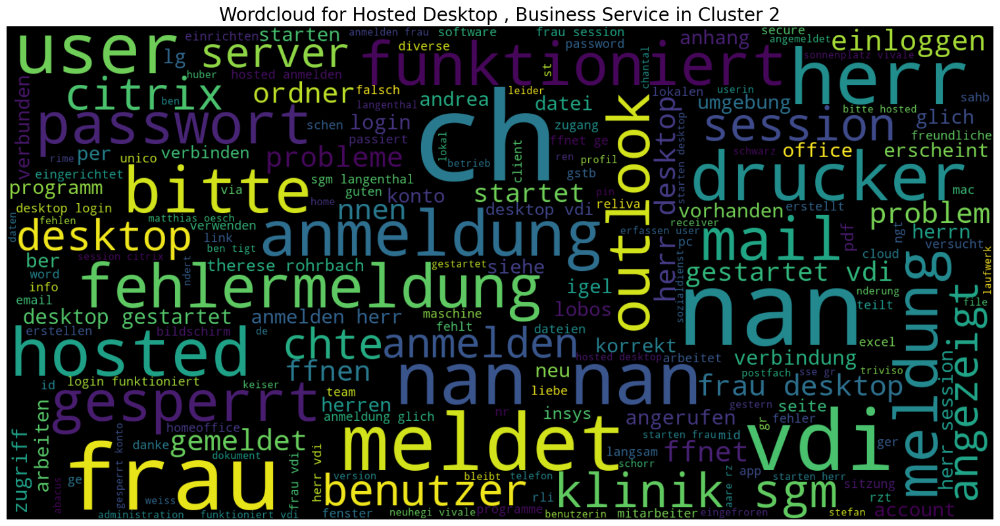

Cluster: 2 for BS:  Hosted Desktop


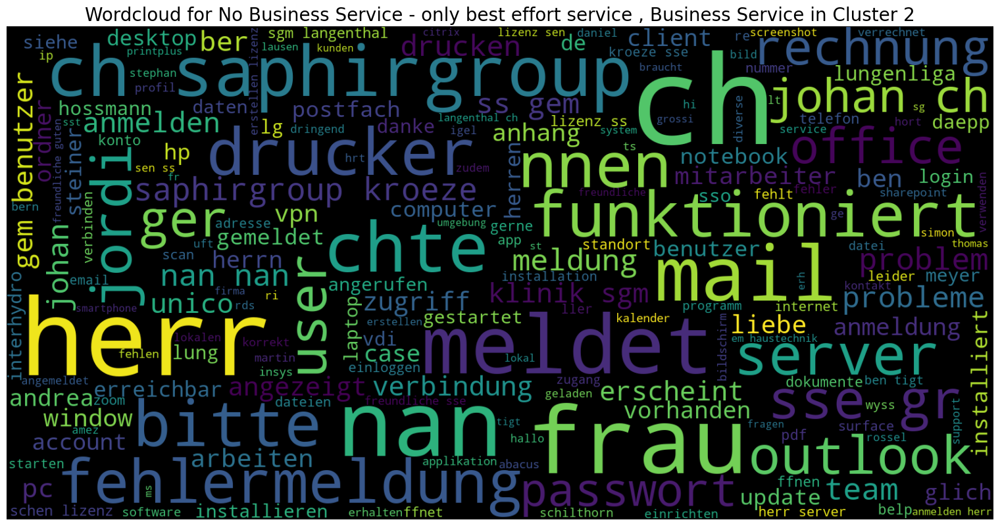

Cluster: 2 for BS:  No Business Service - only best effort service


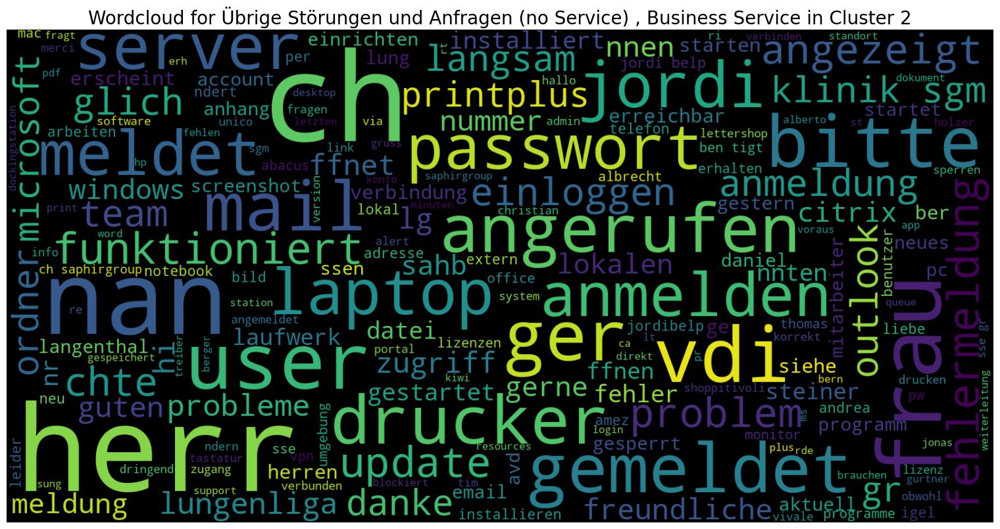

Cluster: 2 for BS:  Übrige Störungen und Anfragen (no Service)


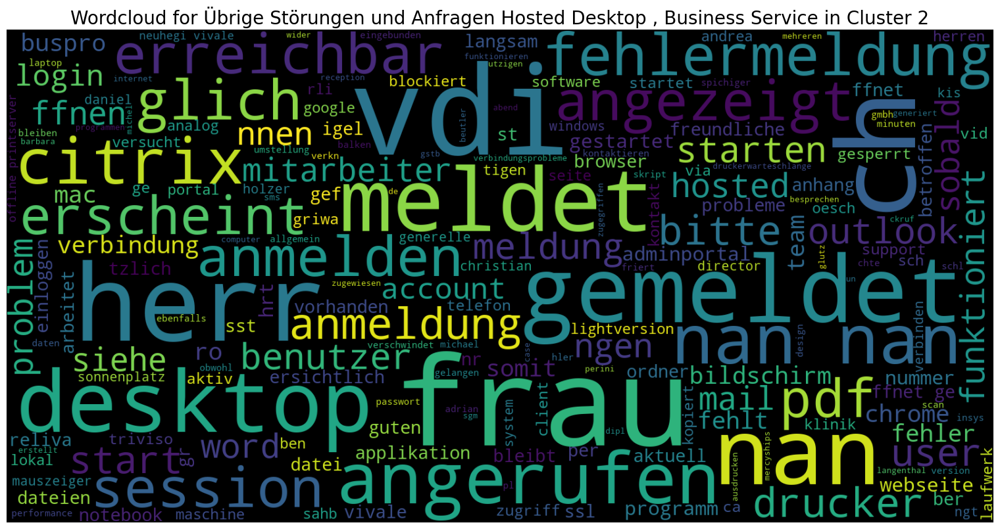

Cluster: 2 for BS:  Übrige Störungen und Anfragen Hosted Desktop


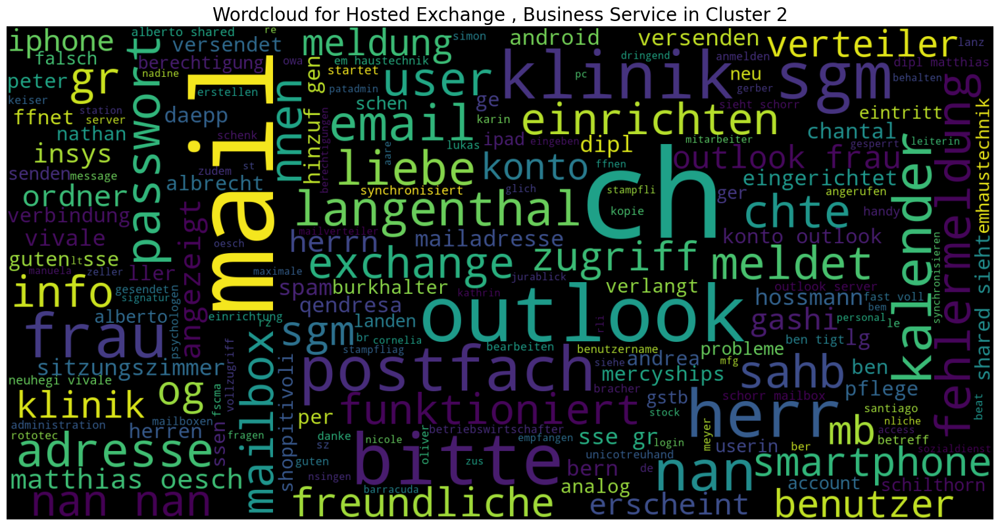

Cluster: 2 for BS:  Hosted Exchange


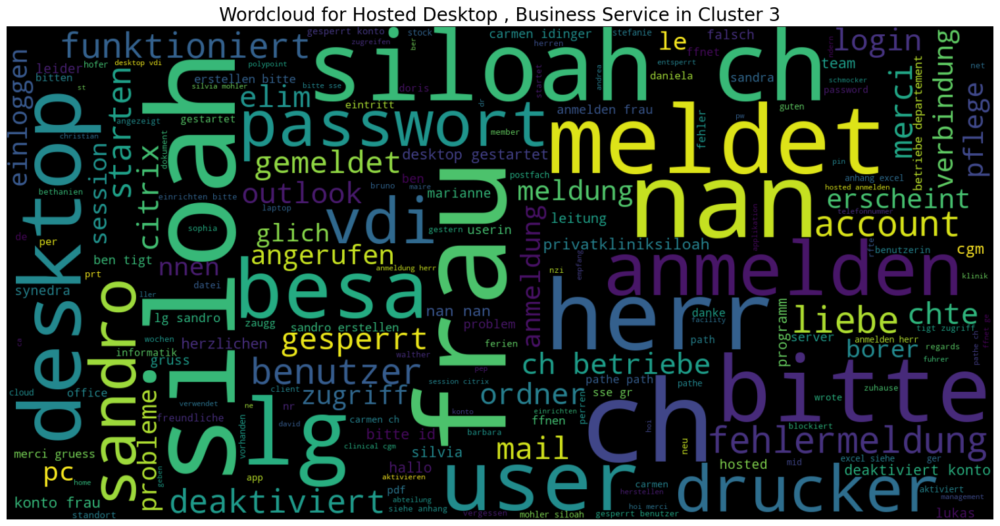

Cluster: 3 for BS:  Hosted Desktop


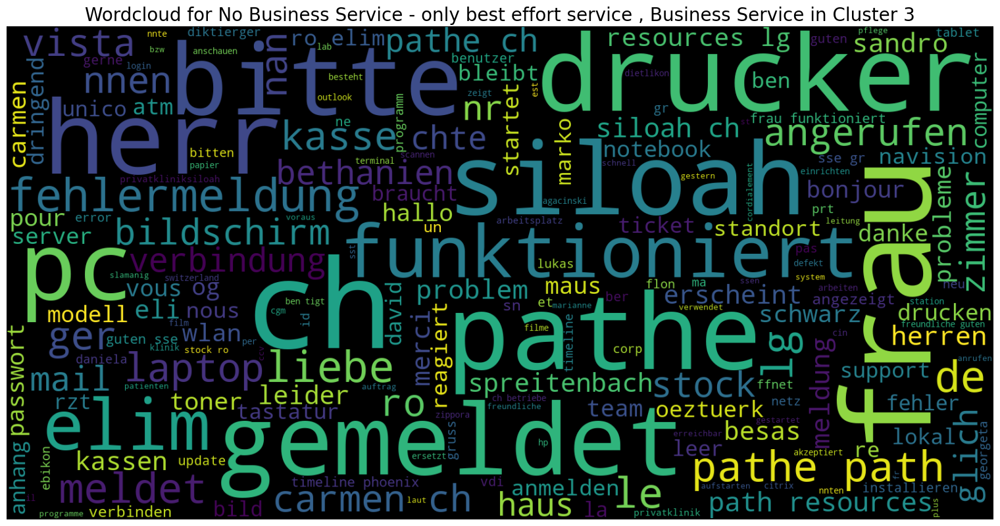

Cluster: 3 for BS:  No Business Service - only best effort service


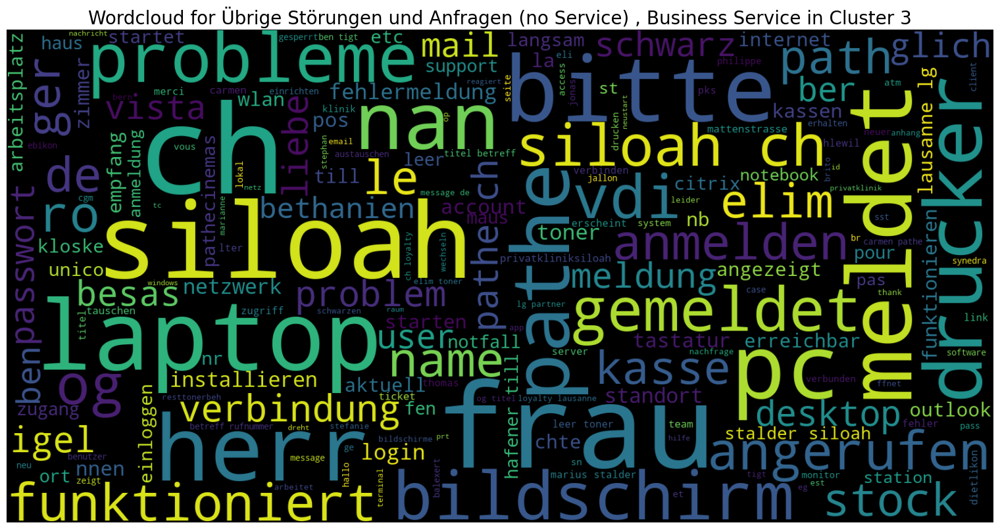

Cluster: 3 for BS:  Übrige Störungen und Anfragen (no Service)


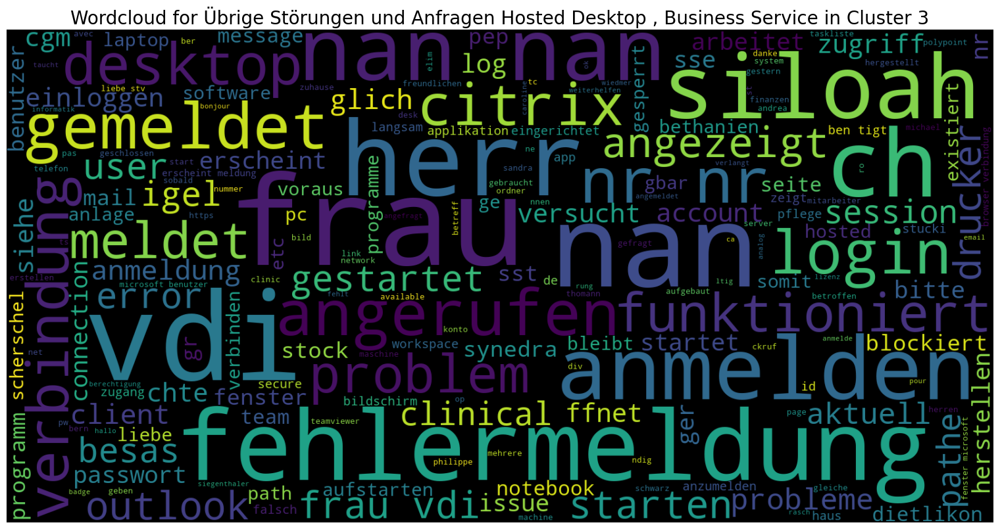

Cluster: 3 for BS:  Übrige Störungen und Anfragen Hosted Desktop


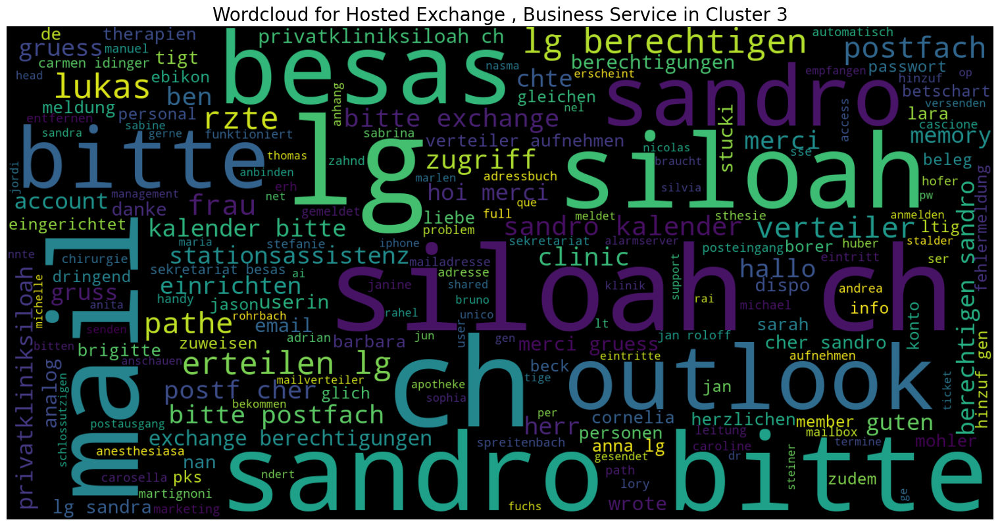

Cluster: 3 for BS:  Hosted Exchange


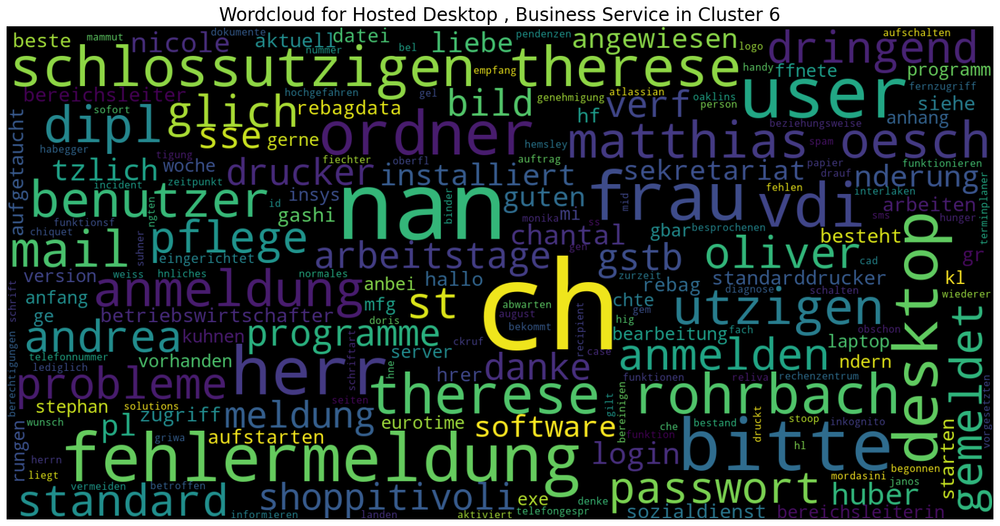

Cluster: 6 for BS:  Hosted Desktop


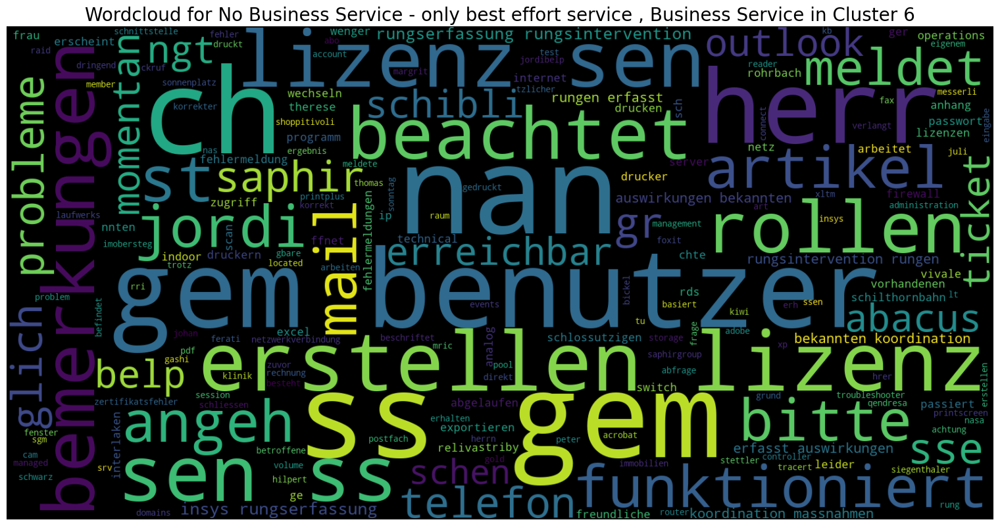

Cluster: 6 for BS:  No Business Service - only best effort service


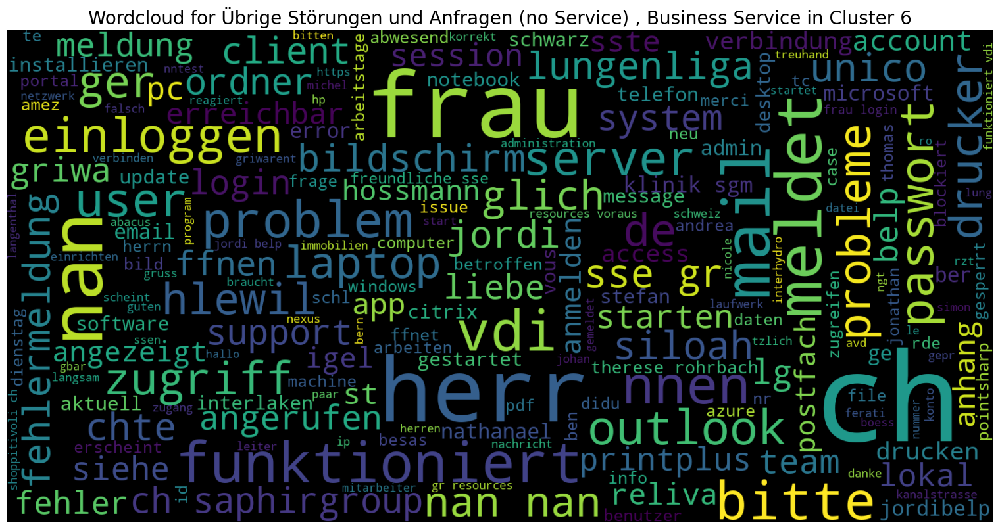

Cluster: 6 for BS:  Übrige Störungen und Anfragen (no Service)


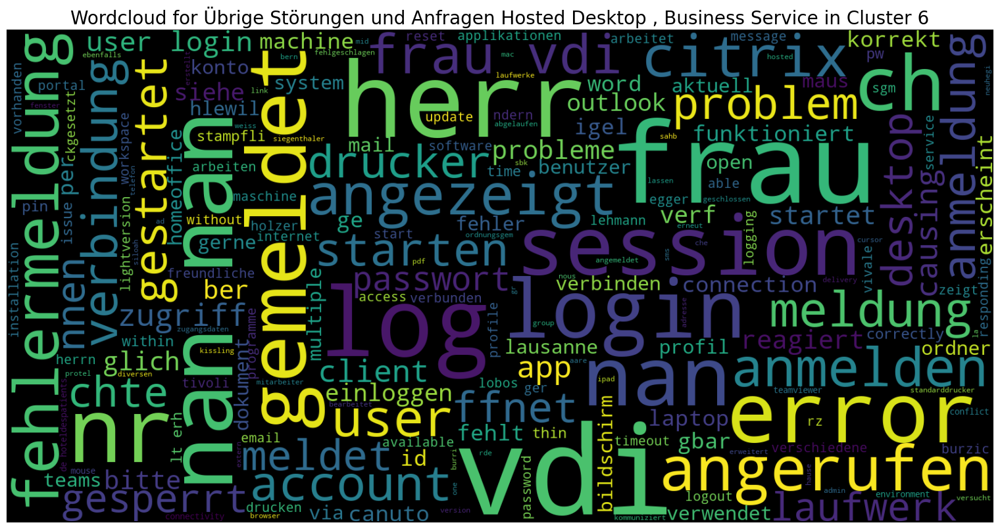

Cluster: 6 for BS:  Übrige Störungen und Anfragen Hosted Desktop


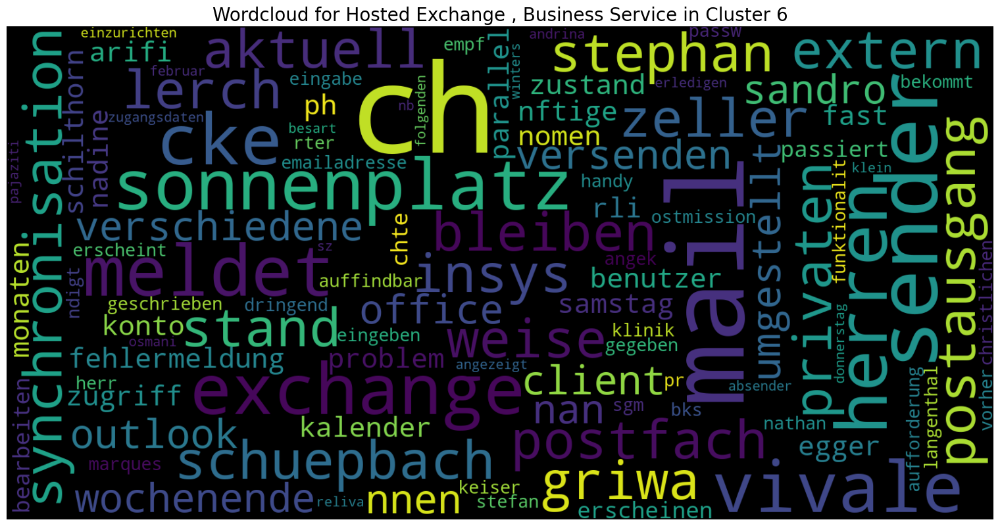

Cluster: 6 for BS:  Hosted Exchange


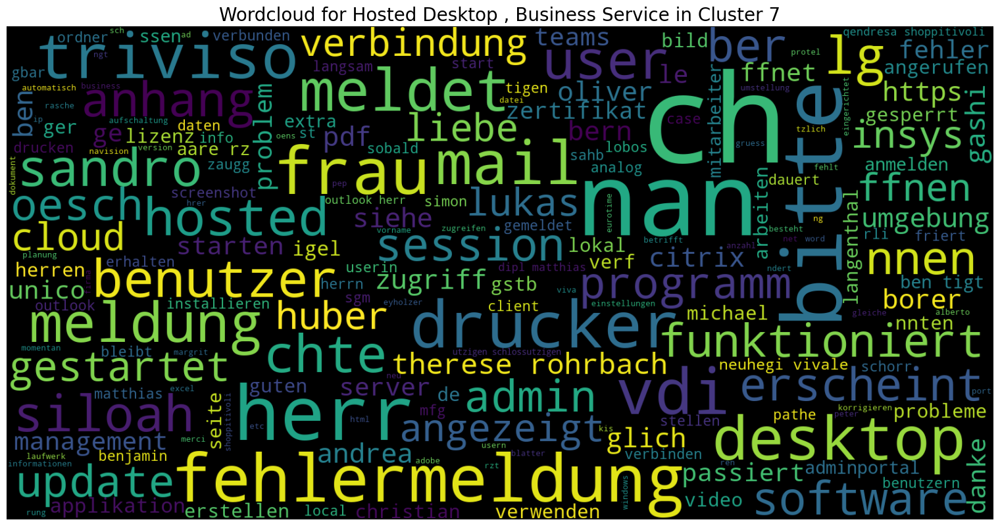

Cluster: 7 for BS:  Hosted Desktop


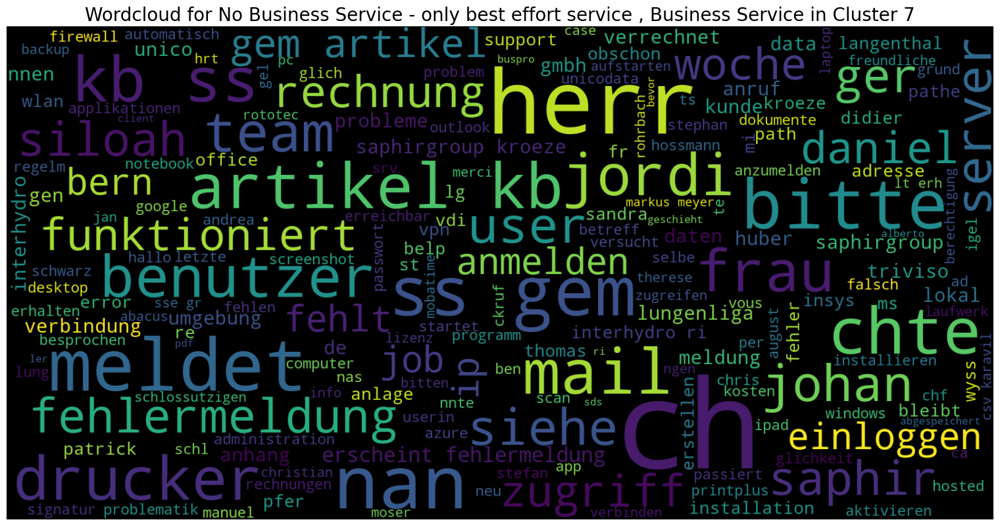

Cluster: 7 for BS:  No Business Service - only best effort service


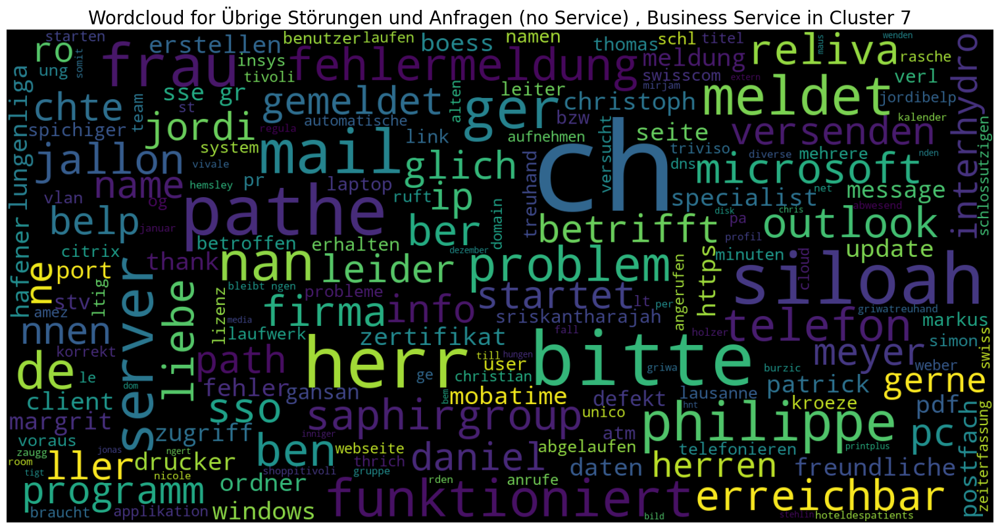

Cluster: 7 for BS:  Übrige Störungen und Anfragen (no Service)


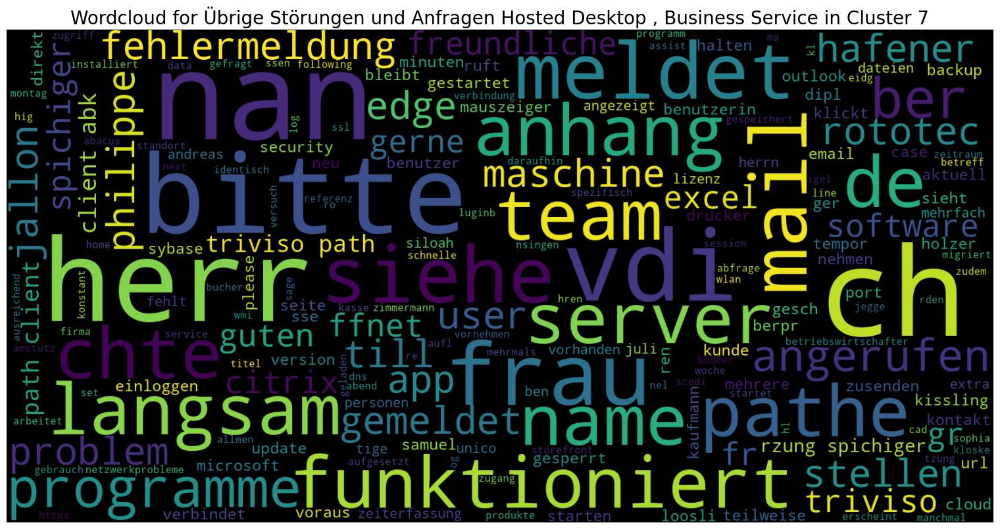

Cluster: 7 for BS:  Übrige Störungen und Anfragen Hosted Desktop


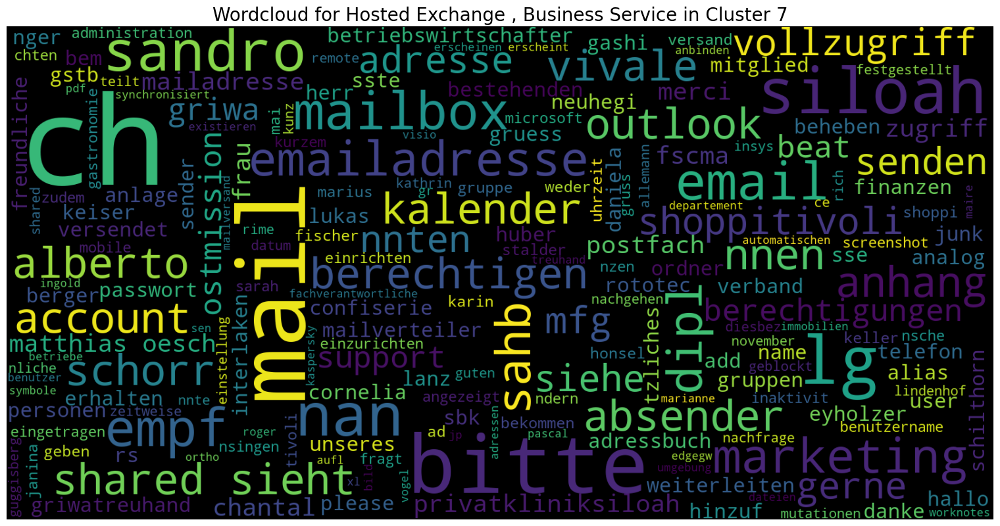

Cluster: 7 for BS:  Hosted Exchange


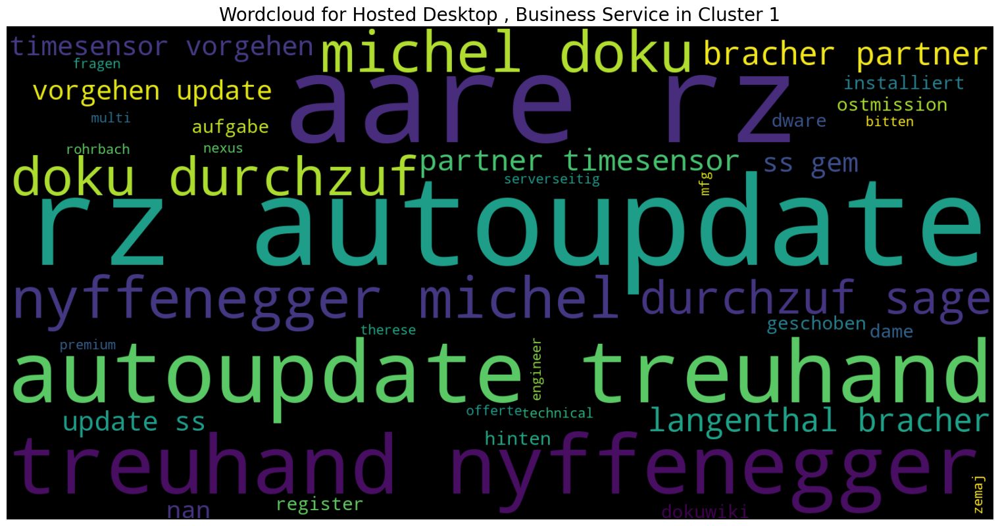

Cluster: 1 for BS:  Hosted Desktop


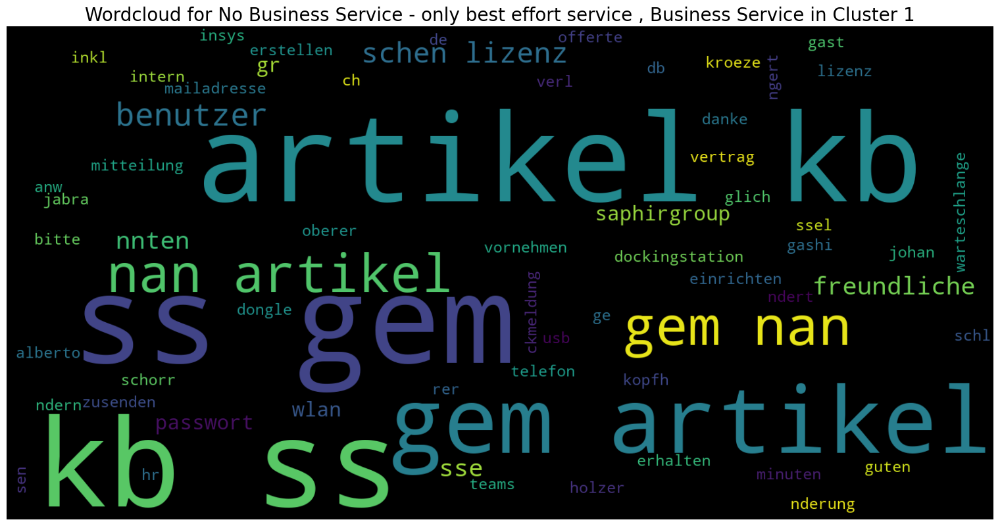

Cluster: 1 for BS:  No Business Service - only best effort service


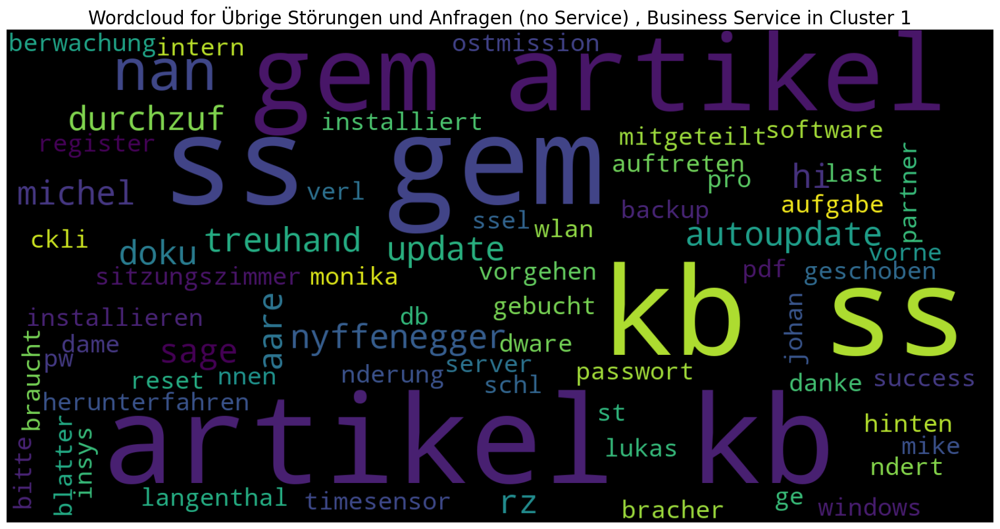

Cluster: 1 for BS:  Übrige Störungen und Anfragen (no Service)


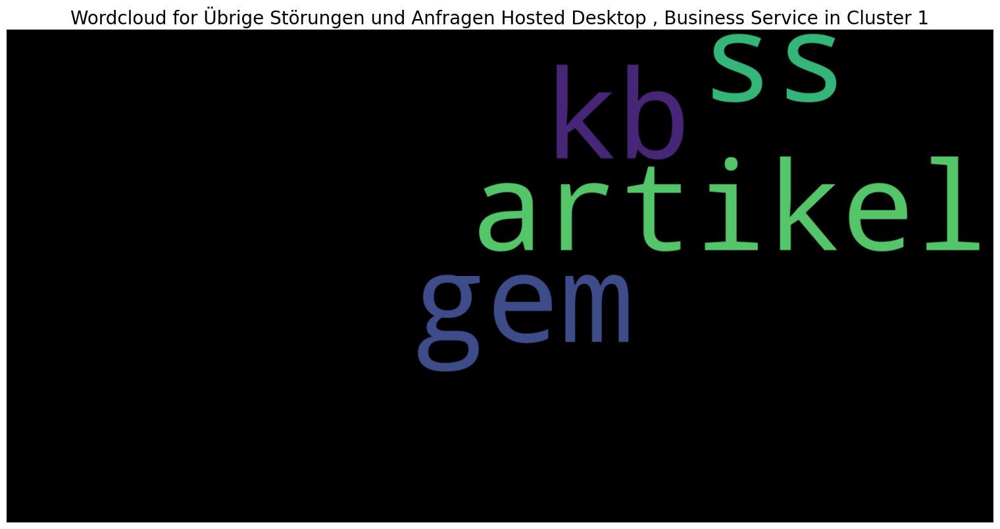

Cluster: 1 for BS:  Übrige Störungen und Anfragen Hosted Desktop


AttributeError: Can only use .str accessor with string values!

In [38]:
def create_wordclouds(df, clusterFilter = None, businessServiceFilter = None, plot_worldcloud=False):
    '''
    param df: dataframe (df_enhance = pd.read_parquet('Daten/Top50Words_OneHot_DataFrame.parquet'))
    clusterFilter: int (example: "1")
    businessServiceFilter: string (example: "skype")
    plot_worldcloud: boolean (default: False)
    
    '''

    # create copy of df
    df_enhance = df.copy()

    # filter for Clusterfilter
    if clusterFilter != None:
        df_enhance = df_enhance[df_enhance["cluster"] == clusterFilter]
    else:
        pass

    # filter for serviceangebotfilter
    if businessServiceFilter != None:
        df_enhance = df_enhance[df_enhance["business_service"] == businessServiceFilter]
    else:
        pass
    

    # filter from df the top 10 words each ticket and turn into list 
    vorcab = np.array(df_enhance["top_10_words_each_ticket_description"].to_list()).reshape(-1, 1)

    # convert vorcab into DataFrame
    df_vorcab = pd.DataFrame(vorcab)
    # rename column from new created dataframe
    df_vorcab.columns = ["top_10_words_each_ticket_description"]

    # filter with regex, not numbers 
    df_vorcab = df_vorcab[(df_vorcab["top_10_words_each_ticket_description"].str.contains(r'[0-9]') == False)]
    # filter with regex, if none remove
    df_vorcab = df_vorcab[df_vorcab["top_10_words_each_ticket_description"] != "none"]

    worldclouds_list = df_vorcab["top_10_words_each_ticket_description"].to_list()  

    # create with worldclouds_list a string a worldcloud
    worldclouds_string = " ".join(worldclouds_list)

    # create wordcloud
    wordcloud = WordCloud(width=1600, height=800, max_font_size=200).generate(worldclouds_string)

    if plot_worldcloud:
        # plot wordcloud
        # set to white background
        # add title 

        plt.figure(figsize=(15,20), facecolor='white', edgecolor='blue')
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.title(f"Wordcloud for {businessServiceFilter} , Business Service in Cluster {clusterFilter}" , fontsize=20)
        plt.axis("off")
        plt.tight_layout(pad=0)
        plt.show()
        # save wordcloud as png
        # import re
        import re
        print(f"Cluster: {clusterFilter} for BS:  {businessServiceFilter}")
        # replace everhy non character with _ in serviceangebotfilter
        businessServiceFilter_string = re.sub(r'\W+', '', businessServiceFilter)
        wordcloud.to_file(f"wordcloud/Cluster{clusterFilter}_{businessServiceFilter_string}.png")


print("Top20 words for business_service")
df_enhance.business_service.value_counts().reset_index().iloc[:5, 0].to_list()

# iterate through top 20 serviceangebot
for cluster in df_enhance.cluster.value_counts().reset_index().iloc[:7, 0].to_list():
    for business_service in df_enhance.business_service.value_counts().reset_index().iloc[:5, 0].to_list():
        create_wordclouds(df_enhance, clusterFilter=cluster, businessServiceFilter=business_service, plot_worldcloud=True)
        # export wordclouds as png  

In [35]:
test = str(df.cluster[0])
print(type(test))
print(str(df.cluster[:10]))

<class 'str'>
0    4
1    4
2    4
3    4
4    2
5    2
6    2
7    2
8    4
9    4
Name: cluster, dtype: int32
